# <p style="padding:10px;background-color:#0f4c5c;margin:0;color:white;font-family:newtimeroman;font-size:150%;text-align:center;border-radius: 15px 50px;overflow:hidden;font-weight:500">produce a color dataset including monochrome images of different colors such as blue, green, red, yellow, black, white, etc. and design and train a neural network to separate them. Report the network results.</p>

## Improt Libraries

In [129]:
import random

import numpy as np
import pandas as pd
import tensorflow as tf

import plotly.express as px
import plotly.subplots as sp
import matplotlib.pyplot as plt
import plotly.graph_objects as go
import plotly.figure_factory as ff

from PIL import Image

from sklearn.metrics import confusion_matrix, accuracy_score
from sklearn.preprocessing import LabelEncoder
from sklearn.model_selection import train_test_split

## Make Dataset

In [4]:
def generate_color_image(color, size=(32, 32)):
    """Generate a monochrome image of the specified color."""
    color_map = {
        'blue': (0, 0, 255),
        'green': (0, 255, 0),
        'red': (255, 0, 0),
        'yellow': (255, 255, 0),
        'black': (0, 0, 0),
        'white': (255, 255, 255)
    }
    
    # Ensure the color is valid
    if color not in color_map:
        raise ValueError(f"Unknown color {color}")
    
    # Create an image of the color
    img = Image.new('RGB', size, color_map[color])
    
    return img

In [5]:
colors = ['blue', 'green', 'red', 'yellow', 'black', 'white']
dataset = []
labels = []

for color in colors:
    for _ in range(1667):  # Produce 1667 images for each color
        img = generate_color_image(color)
        dataset.append(np.array(img))
        labels.append(color)

# Convert the dataset list to a numpy array
dataset = np.array(dataset)
labels = np.array(labels)

print(dataset.shape)  # This should print (10002, 32, 32, 3) - 10,002 due to rounding
print(labels.shape)  # This should print (10002,)
print(labels[:10])  # This will print the labels of the first 10 images, all should be 'blue'

(10002, 32, 32, 3)
(10002,)
['blue' 'blue' 'blue' 'blue' 'blue' 'blue' 'blue' 'blue' 'blue' 'blue']


In [18]:
# Generate random indices for shuffling
num_samples = len(labels)
shuffled_indices = np.random.permutation(num_samples)

# Shuffle images and labels using the shuffled indices
dataset = dataset[shuffled_indices]
labels = labels[shuffled_indices]

## EDA

#### 1. Distribution of Colors

In [19]:
fig1 = px.histogram(labels, title="Color Distribution")
fig1.show()

#### 2. Sample Images Grid

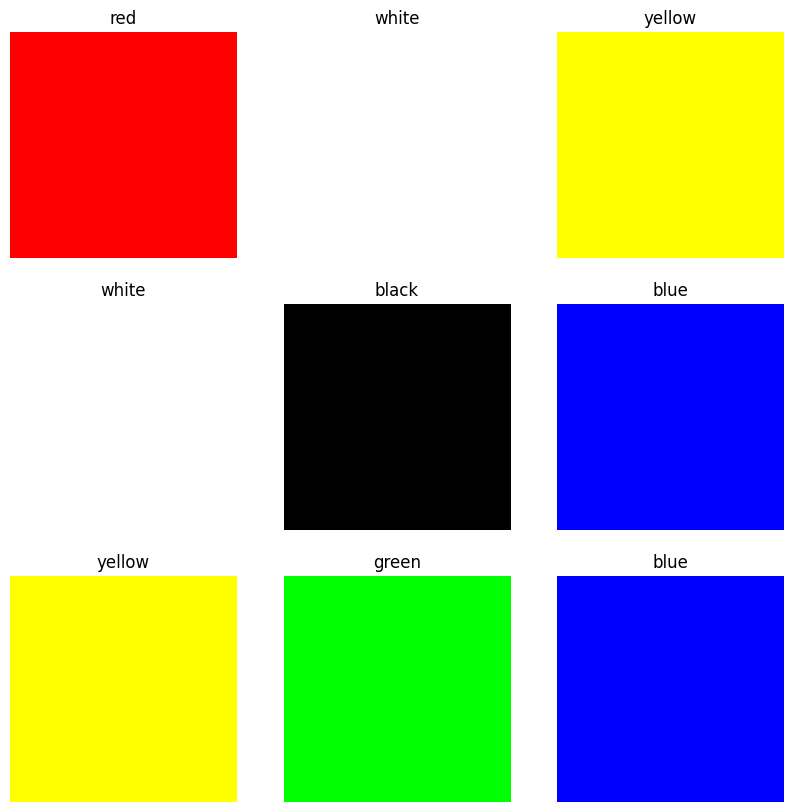

In [21]:
plt.figure(figsize=(10, 10))
for i in range(9):
    ax = plt.subplot(3, 3, i + 1)
    plt.imshow(dataset[i].astype("uint8"))
    plt.title(labels[i])
    plt.axis("off")

In [23]:
fig2 = px.imshow(random.choice(dataset), title="Sample Images Grid")
fig2.show()

#### 3. Mean Intensity of Each Color

In [24]:
mean_intensities = [np.mean(img) for img in dataset]
fig3 = px.scatter(x=labels, y=mean_intensities, title="Mean Intensity by Color")
fig3.show()

#### 4. Pairwise Scatter Plot of Mean RGB Intensities

In [25]:
mean_rgb = [np.mean(img, axis=(0, 1)) for img in dataset]
fig4 = px.scatter_matrix(mean_rgb, dimensions=[0, 1, 2], color=labels, title="Pairwise Scatter Plot of Mean RGB Intensities")
fig4.show()

#### 5. Image Intensity Distribution

In [26]:
intensities = dataset.mean(axis=(1, 2, 3))
fig5 = px.histogram(intensities, title="Image Intensity Distribution")
fig5.show()

#### 6. 3D Scatter Plot of RGB Intensities

In [27]:
fig6 = px.scatter_3d(mean_rgb, x=0, y=1, z=2, color=labels, title="3D Scatter Plot of Mean RGB Intensities")
fig6.show()

#### 7. Pie Chart of Color Distribution

In [28]:
# Calculate color counts within this scope
color_counts = {color: len(np.where(labels == color)[0]) for color in colors}

fig7 = px.pie(names=colors, values=list(color_counts.values()), title="Pie Chart of Color Distribution")
fig7.show()

## Build Model

#### 1. Prepare Data

In [29]:
# Encode labels
le = LabelEncoder()
encoded_labels = le.fit_transform(labels)
y = tf.keras.utils.to_categorical(encoded_labels)

In [30]:
y

array([[0., 0., 0., 1., 0., 0.],
       [0., 0., 0., 0., 1., 0.],
       [0., 0., 0., 0., 0., 1.],
       ...,
       [0., 0., 0., 1., 0., 0.],
       [0., 0., 0., 1., 0., 0.],
       [0., 0., 1., 0., 0., 0.]], dtype=float32)

In [38]:
# Split dataset
X_train, X_test, y_train, y_test = train_test_split(dataset, y, test_size=0.2, shuffle=False)

#### 2. Model

In [107]:
model = tf.keras.models.Sequential([
    tf.keras.layers.Conv2D(32, (3,3), activation='relu', input_shape=(32, 32, 3)),
    tf.keras.layers.MaxPooling2D(2, 2),
    tf.keras.layers.Conv2D(64, (3,3), activation='relu'),
    tf.keras.layers.MaxPooling2D(2, 2),
    tf.keras.layers.Flatten(),
    tf.keras.layers.Dense(128, activation='relu'),
    tf.keras.layers.Dense(6, activation='softmax')
])

#### 3. Compile Model

In [108]:
model.compile(optimizer='adam', loss='categorical_crossentropy', metrics=['accuracy'])

#### 4. Fit Model

In [109]:
history = model.fit(np.array(X_train), np.array(y_train), epochs=10, validation_data=(np.array(X_test), np.array(y_test)))

Epoch 1/10
251/251 [==============================] - 2s 7ms/step - loss: 0.5111 - accuracy: 0.9926 - val_loss: 4.6202e-05 - val_accuracy: 1.0000
Epoch 2/10
251/251 [==============================] - 1s 6ms/step - loss: 2.0205e-05 - accuracy: 1.0000 - val_loss: 8.8658e-06 - val_accuracy: 1.0000
Epoch 3/10
251/251 [==============================] - 1s 6ms/step - loss: 5.6064e-06 - accuracy: 1.0000 - val_loss: 3.6150e-06 - val_accuracy: 1.0000
Epoch 4/10
251/251 [==============================] - 1s 6ms/step - loss: 2.6050e-06 - accuracy: 1.0000 - val_loss: 1.9186e-06 - val_accuracy: 1.0000
Epoch 5/10
251/251 [==============================] - 1s 6ms/step - loss: 1.4753e-06 - accuracy: 1.0000 - val_loss: 1.1916e-06 - val_accuracy: 1.0000
Epoch 6/10
251/251 [==============================] - 1s 6ms/step - loss: 9.4935e-07 - accuracy: 1.0000 - val_loss: 7.8764e-07 - val_accuracy: 1.0000
Epoch 7/10
251/251 [==============================] - 1s 6ms/step - loss: 6.5369e-07 - accuracy: 1.0000 

#### 5. Plot Loss and Accuracy of Model

In [110]:
# Extract training history
training_loss = history.history['loss']
training_accuracy = history.history['accuracy']
validation_loss = history.history['val_loss']
validation_accuracy = history.history['val_accuracy']
epochs = list(range(1, len(training_loss) + 1))  # Convert range to list

# Create subplots
fig = go.Figure()

# Add training loss plot
fig.add_trace(go.Scatter(x=epochs, y=training_loss, mode='lines+markers', name='Training Loss'))
# Add validation loss plot
fig.add_trace(go.Scatter(x=epochs, y=validation_loss, mode='lines+markers', name='Validation Loss'))
# Add training accuracy plot
fig.add_trace(go.Scatter(x=epochs, y=training_accuracy, mode='lines+markers', name='Training Accuracy'))
# Add validation accuracy plot
fig.add_trace(go.Scatter(x=epochs, y=validation_accuracy, mode='lines+markers', name='Validation Accuracy'))

# Update layout
fig.update_layout(title='Training and Validation Metrics',
                  xaxis_title='Epochs',
                  yaxis_title='Value',
                  legend=dict(x=0.7, y=1),
                  template='plotly_dark')

# Show the plot
fig.show()

In [111]:
evaluation_result = model.evaluate(np.array(X_test), np.array(y_test))
print(f"Test Loss: {evaluation_result[0]:.4f}")
print(f"Test Accuracy: {evaluation_result[1]*100:.2f}%")

63/63 [==============================] - 0s 4ms/step - loss: 2.4235e-07 - accuracy: 1.0000
Test Loss: 0.0000
Test Accuracy: 100.00%


In [112]:
# Get predicted probabilities for each class
y_pred_probs = model.predict(X_test)

# Get the predicted class labels by selecting the index of the maximum probability
y_pred = np.argmax(y_pred_probs, axis=1)

# Convert encoded labels back to original labels
y_pred_la = le.inverse_transform(y_pred)
y_pred_la

63/63 [==============================] - 0s 2ms/step


array(['black', 'red', 'blue', ..., 'red', 'red', 'green'], dtype='<U6')

In [113]:
# Get the predicted class labels by selecting the index of the maximum probability
y_test_ma = y_test.argmax(axis=1)

# Convert encoded labels back to original labels
y_test_la = le.inverse_transform(y_test_ma)
y_test_la

array(['black', 'red', 'blue', ..., 'red', 'red', 'green'], dtype='<U6')

#### 6. Confusion Matrix

In [114]:
# Calculate the confusion matrix
cm = confusion_matrix(y_test.argmax(axis=1), y_pred)

# Create a confusion matrix heatmap
fig = ff.create_annotated_heatmap(z=cm,
                                  x=['blue', 'green', 'red', 'yellow', 'black', 'white'],
                                  y=['blue', 'green', 'red', 'yellow', 'black', 'white'],
                                  colorscale='Blackbody')

# Update layout
fig.update_layout(title='Confusion Matrix',
                  xaxis_title='Predicted',
                  yaxis_title='Actual',
                  template='plotly_white')

# Show the plot
fig.show()

In [115]:
# Select one image for each color
color_indices = [np.where(y_test[:, i] == 1)[0][0] for i in range(len(colors))]

# Create a 2x3 grid of subplots
rows = 2
cols = 3
fig = sp.make_subplots(rows=rows, cols=cols, subplot_titles=[f"True: {y_test_la[index]} | Pred: {y_pred_la[index]}" for index in color_indices])

# Populate the subplots with images and labels
for i, index in enumerate(color_indices):
    row = i // cols + 1
    col = i % cols + 1
    img = X_test[index]
    true_label = y_test_la[index]
    pred_label = y_pred_la[index]
    title = f"True: {true_label} | Pred: {pred_label}"
    trace = go.Image(z=img)
    fig.add_trace(trace, row=row, col=col)
    fig.update_xaxes(showticklabels=False, row=row, col=col)
    fig.update_yaxes(showticklabels=False, row=row, col=col)

# Update layout and show the plot
fig.update_layout(title=f"Images of Different Colors: True vs Predicted Labels", title_x=0.5)
fig.show()

# <p style="padding:10px;background-color:#0f4c5c;margin:0;color:white;font-family:newtimeroman;font-size:150%;text-align:center;border-radius: 15px 50px;overflow:hidden;font-weight:500">Add Noise to Images and Evaluate:</p>

In [122]:
# Add Gaussian noise to images
noisy_X_test = X_test + np.random.normal(loc=0, scale=25, size=X_test.shape)  # Adjust 'scale' as needed

# Predict labels for noisy images
noisy_y_pred = model.predict(noisy_X_test)
noisy_y_pred_labels = np.argmax(noisy_y_pred, axis=1)

# Evaluate accuracy on noisy images
noisy_accuracy = np.sum(noisy_y_pred_labels == y_test.argmax(axis=1)) / len(y_test)

print(f"Noisy Images Accuracy: {noisy_accuracy:.4f}")

63/63 [==============================] - 0s 3ms/step
Noisy Images Accuracy: 0.9970


In [123]:
# Convert encoded labels back to original labels
noisy_y_pred_la = le.inverse_transform(noisy_y_pred_labels)
noisy_y_pred_la

array(['black', 'red', 'blue', ..., 'red', 'red', 'green'], dtype='<U6')

In [124]:
# Calculate the confusion matrix
cm = confusion_matrix(y_test.argmax(axis=1), noisy_y_pred_labels)

# Create a confusion matrix heatmap
fig = ff.create_annotated_heatmap(z=cm,
                                  x=['black', 'blue', 'green', 'red', 'yellow', 'white'],
                                  y=['black', 'blue', 'green', 'red', 'yellow', 'white'],
                                  colorscale='Blackbody')

# Update layout
fig.update_layout(title='Confusion Matrix',
                  xaxis_title='Predicted',
                  yaxis_title='Actual',
                  template='plotly_white')

# Show the plot
fig.show()

In [125]:
# Select one image for each color
color_indices = [np.where(y_test[:, i] == 1)[0][0] for i in range(len(colors))]

# Create a 2x3 grid of subplots
rows = 2
cols = 3
fig = sp.make_subplots(rows=rows, cols=cols, subplot_titles=[f"True: {y_test_la[index]} | Pred: {noisy_y_pred_la[index]}" for index in color_indices])

# Populate the subplots with images and labels
for i, index in enumerate(color_indices):
    row = i // cols + 1
    col = i % cols + 1
    img = noisy_X_test[index]
    true_label = y_test_la[index]
    pred_label = noisy_y_pred_la[index]
    title = f"True: {true_label} | Pred: {pred_label}"
    trace = go.Image(z=img)
    fig.add_trace(trace, row=row, col=col)
    fig.update_xaxes(showticklabels=False, row=row, col=col)
    fig.update_yaxes(showticklabels=False, row=row, col=col)

# Update layout and show the plot
fig.update_layout(title=f"Images of Different Colors: True vs Predicted Labels", title_x=0.5)
fig.show()

# <p style="padding:10px;background-color:#0f4c5c;margin:0;color:white;font-family:newtimeroman;font-size:150%;text-align:center;border-radius: 15px 50px;overflow:hidden;font-weight:500">Find Maximum Noise:</p>

In [142]:
max_noise_level = 100  # Adjust this based on your data and model

noise_levels = []
accuracies = []

for noise_level in range(51):
    noisy_X_test = X_test + np.random.normal(loc=0, scale=noise_level*2, size=X_test.shape)
    noisy_y_pred = model.predict(noisy_X_test)
    noisy_y_pred_labels = np.argmax(noisy_y_pred, axis=1)
    accuracy = accuracy_score(y_test.argmax(axis=1), noisy_y_pred_labels)
    noise_levels.append(noise_level*2)
    accuracies.append(accuracy)
    print(f"Noise Level: {noise_level*2}, Accuracy: {accuracy:.4f}")

# Create a scatter plot of accuracy vs. noise level
fig = go.Figure(data=go.Scatter(x=noise_levels, y=accuracies, mode='lines+markers'))
fig.update_layout(title='Accuracy vs. Noise Level',
                  xaxis_title='Noise Level',
                  yaxis_title='Accuracy')

# Show the plot
fig.show()

63/63 [==============================] - 0s 4ms/step
Noise Level: 0, Accuracy: 1.0000
63/63 [==============================] - 0s 2ms/step
Noise Level: 2, Accuracy: 1.0000
63/63 [==============================] - 0s 2ms/step
Noise Level: 4, Accuracy: 1.0000
63/63 [==============================] - 0s 2ms/step
Noise Level: 6, Accuracy: 1.0000
63/63 [==============================] - 0s 2ms/step
Noise Level: 8, Accuracy: 1.0000
63/63 [==============================] - 0s 2ms/step
Noise Level: 10, Accuracy: 1.0000
63/63 [==============================] - 0s 2ms/step
Noise Level: 12, Accuracy: 1.0000
63/63 [==============================] - 0s 2ms/step
Noise Level: 14, Accuracy: 1.0000
63/63 [==============================] - 0s 3ms/step
Noise Level: 16, Accuracy: 1.0000
63/63 [==============================] - 0s 2ms/step
Noise Level: 18, Accuracy: 1.0000
63/63 [==============================] - 0s 2ms/step
Noise Level: 20, Accuracy: 1.0000
63/63 [==============================] - 0s 2ms/

## 1. Noise Level: 10

In [131]:
noise_level = 10

# Add Gaussian noise to images
noisy_X_test = X_test + np.random.normal(loc=0, scale=noise_level, size=X_test.shape)  # Adjust 'scale' as needed

# Predict labels for noisy images
noisy_y_pred = model.predict(noisy_X_test)
noisy_y_pred_labels = np.argmax(noisy_y_pred, axis=1)
noisy_y_pred_la = le.inverse_transform(noisy_y_pred_labels)

# Evaluate accuracy on noisy images
noisy_accuracy = np.sum(noisy_y_pred_labels == y_test.argmax(axis=1)) / len(y_test)

print(f"Noisy Images Accuracy: {noisy_accuracy:.4f}")

# Calculate the confusion matrix
cm = confusion_matrix(y_test.argmax(axis=1), noisy_y_pred_labels)

# Create a confusion matrix heatmap
fig = ff.create_annotated_heatmap(z=cm,
                                  x=['black', 'blue', 'green', 'red', 'yellow', 'white'],
                                  y=['black', 'blue', 'green', 'red', 'yellow', 'white'],
                                  colorscale='Blackbody')

# Update layout
fig.update_layout(title='Confusion Matrix',
                  xaxis_title='Predicted',
                  yaxis_title='Actual',
                  template='plotly_white')

# Show the plot
fig.show()

# Select one image for each color
color_indices = [np.where(y_test[:, i] == 1)[0][0] for i in range(len(colors))]

# Create a 2x3 grid of subplots
rows = 2
cols = 3
fig = sp.make_subplots(rows=rows, cols=cols, subplot_titles=[f"True: {y_test_la[index]} | Pred: {noisy_y_pred_la[index]}" for index in color_indices])

# Populate the subplots with images and labels
for i, index in enumerate(color_indices):
    row = i // cols + 1
    col = i % cols + 1
    img = noisy_X_test[index]
    true_label = y_test_la[index]
    pred_label = noisy_y_pred_la[index]
    title = f"True: {true_label} | Pred: {pred_label}"
    trace = go.Image(z=img)
    fig.add_trace(trace, row=row, col=col)
    fig.update_xaxes(showticklabels=False, row=row, col=col)
    fig.update_yaxes(showticklabels=False, row=row, col=col)

# Update layout and show the plot
fig.update_layout(title=f"Images of Different Colors: True vs Predicted Labels", title_x=0.5)
fig.show()

63/63 [==============================] - 0s 4ms/step
Noisy Images Accuracy: 1.0000


## 2. Noise Level: 20

In [132]:
noise_level = 20

# Add Gaussian noise to images
noisy_X_test = X_test + np.random.normal(loc=0, scale=noise_level, size=X_test.shape)  # Adjust 'scale' as needed

# Predict labels for noisy images
noisy_y_pred = model.predict(noisy_X_test)
noisy_y_pred_labels = np.argmax(noisy_y_pred, axis=1)
noisy_y_pred_la = le.inverse_transform(noisy_y_pred_labels)

# Evaluate accuracy on noisy images
noisy_accuracy = np.sum(noisy_y_pred_labels == y_test.argmax(axis=1)) / len(y_test)

print(f"Noisy Images Accuracy: {noisy_accuracy:.4f}")

# Calculate the confusion matrix
cm = confusion_matrix(y_test.argmax(axis=1), noisy_y_pred_labels)

# Create a confusion matrix heatmap
fig = ff.create_annotated_heatmap(z=cm,
                                  x=['black', 'blue', 'green', 'red', 'yellow', 'white'],
                                  y=['black', 'blue', 'green', 'red', 'yellow', 'white'],
                                  colorscale='Blackbody')

# Update layout
fig.update_layout(title='Confusion Matrix',
                  xaxis_title='Predicted',
                  yaxis_title='Actual',
                  template='plotly_white')

# Show the plot
fig.show()

# Select one image for each color
color_indices = [np.where(y_test[:, i] == 1)[0][0] for i in range(len(colors))]

# Create a 2x3 grid of subplots
rows = 2
cols = 3
fig = sp.make_subplots(rows=rows, cols=cols, subplot_titles=[f"True: {y_test_la[index]} | Pred: {noisy_y_pred_la[index]}" for index in color_indices])

# Populate the subplots with images and labels
for i, index in enumerate(color_indices):
    row = i // cols + 1
    col = i % cols + 1
    img = noisy_X_test[index]
    true_label = y_test_la[index]
    pred_label = noisy_y_pred_la[index]
    title = f"True: {true_label} | Pred: {pred_label}"
    trace = go.Image(z=img)
    fig.add_trace(trace, row=row, col=col)
    fig.update_xaxes(showticklabels=False, row=row, col=col)
    fig.update_yaxes(showticklabels=False, row=row, col=col)

# Update layout and show the plot
fig.update_layout(title=f"Images of Different Colors: True vs Predicted Labels", title_x=0.5)
fig.show()

63/63 [==============================] - 0s 4ms/step
Noisy Images Accuracy: 1.0000


## 3. Noise Level: 30

In [133]:
noise_level = 30

# Add Gaussian noise to images
noisy_X_test = X_test + np.random.normal(loc=0, scale=noise_level, size=X_test.shape)  # Adjust 'scale' as needed

# Predict labels for noisy images
noisy_y_pred = model.predict(noisy_X_test)
noisy_y_pred_labels = np.argmax(noisy_y_pred, axis=1)
noisy_y_pred_la = le.inverse_transform(noisy_y_pred_labels)

# Evaluate accuracy on noisy images
noisy_accuracy = np.sum(noisy_y_pred_labels == y_test.argmax(axis=1)) / len(y_test)

print(f"Noisy Images Accuracy: {noisy_accuracy:.4f}")

# Calculate the confusion matrix
cm = confusion_matrix(y_test.argmax(axis=1), noisy_y_pred_labels)

# Create a confusion matrix heatmap
fig = ff.create_annotated_heatmap(z=cm,
                                  x=['black', 'blue', 'green', 'red', 'yellow', 'white'],
                                  y=['black', 'blue', 'green', 'red', 'yellow', 'white'],
                                  colorscale='Blackbody')

# Update layout
fig.update_layout(title='Confusion Matrix',
                  xaxis_title='Predicted',
                  yaxis_title='Actual',
                  template='plotly_white')

# Show the plot
fig.show()

# Select one image for each color
color_indices = [np.where(y_test[:, i] == 1)[0][0] for i in range(len(colors))]

# Create a 2x3 grid of subplots
rows = 2
cols = 3
fig = sp.make_subplots(rows=rows, cols=cols, subplot_titles=[f"True: {y_test_la[index]} | Pred: {noisy_y_pred_la[index]}" for index in color_indices])

# Populate the subplots with images and labels
for i, index in enumerate(color_indices):
    row = i // cols + 1
    col = i % cols + 1
    img = noisy_X_test[index]
    true_label = y_test_la[index]
    pred_label = noisy_y_pred_la[index]
    title = f"True: {true_label} | Pred: {pred_label}"
    trace = go.Image(z=img)
    fig.add_trace(trace, row=row, col=col)
    fig.update_xaxes(showticklabels=False, row=row, col=col)
    fig.update_yaxes(showticklabels=False, row=row, col=col)

# Update layout and show the plot
fig.update_layout(title=f"Images of Different Colors: True vs Predicted Labels", title_x=0.5)
fig.show()

63/63 [==============================] - 0s 4ms/step
Noisy Images Accuracy: 0.8301


## 4. Noise Level: 40

In [134]:
noise_level = 40

# Add Gaussian noise to images
noisy_X_test = X_test + np.random.normal(loc=0, scale=noise_level, size=X_test.shape)  # Adjust 'scale' as needed

# Predict labels for noisy images
noisy_y_pred = model.predict(noisy_X_test)
noisy_y_pred_labels = np.argmax(noisy_y_pred, axis=1)
noisy_y_pred_la = le.inverse_transform(noisy_y_pred_labels)

# Evaluate accuracy on noisy images
noisy_accuracy = np.sum(noisy_y_pred_labels == y_test.argmax(axis=1)) / len(y_test)

print(f"Noisy Images Accuracy: {noisy_accuracy:.4f}")

# Calculate the confusion matrix
cm = confusion_matrix(y_test.argmax(axis=1), noisy_y_pred_labels)

# Create a confusion matrix heatmap
fig = ff.create_annotated_heatmap(z=cm,
                                  x=['black', 'blue', 'green', 'red', 'yellow', 'white'],
                                  y=['black', 'blue', 'green', 'red', 'yellow', 'white'],
                                  colorscale='Blackbody')

# Update layout
fig.update_layout(title='Confusion Matrix',
                  xaxis_title='Predicted',
                  yaxis_title='Actual',
                  template='plotly_white')

# Show the plot
fig.show()

# Select one image for each color
color_indices = [np.where(y_test[:, i] == 1)[0][0] for i in range(len(colors))]

# Create a 2x3 grid of subplots
rows = 2
cols = 3
fig = sp.make_subplots(rows=rows, cols=cols, subplot_titles=[f"True: {y_test_la[index]} | Pred: {noisy_y_pred_la[index]}" for index in color_indices])

# Populate the subplots with images and labels
for i, index in enumerate(color_indices):
    row = i // cols + 1
    col = i % cols + 1
    img = noisy_X_test[index]
    true_label = y_test_la[index]
    pred_label = noisy_y_pred_la[index]
    title = f"True: {true_label} | Pred: {pred_label}"
    trace = go.Image(z=img)
    fig.add_trace(trace, row=row, col=col)
    fig.update_xaxes(showticklabels=False, row=row, col=col)
    fig.update_yaxes(showticklabels=False, row=row, col=col)

# Update layout and show the plot
fig.update_layout(title=f"Images of Different Colors: True vs Predicted Labels", title_x=0.5)
fig.show()

63/63 [==============================] - 0s 4ms/step
Noisy Images Accuracy: 0.5717


## 5. Noise Level: 50

In [135]:
noise_level = 50

# Add Gaussian noise to images
noisy_X_test = X_test + np.random.normal(loc=0, scale=noise_level, size=X_test.shape)  # Adjust 'scale' as needed

# Predict labels for noisy images
noisy_y_pred = model.predict(noisy_X_test)
noisy_y_pred_labels = np.argmax(noisy_y_pred, axis=1)
noisy_y_pred_la = le.inverse_transform(noisy_y_pred_labels)

# Evaluate accuracy on noisy images
noisy_accuracy = np.sum(noisy_y_pred_labels == y_test.argmax(axis=1)) / len(y_test)

print(f"Noisy Images Accuracy: {noisy_accuracy:.4f}")

# Calculate the confusion matrix
cm = confusion_matrix(y_test.argmax(axis=1), noisy_y_pred_labels)

# Create a confusion matrix heatmap
fig = ff.create_annotated_heatmap(z=cm,
                                  x=['black', 'blue', 'green', 'red', 'yellow', 'white'],
                                  y=['black', 'blue', 'green', 'red', 'yellow', 'white'],
                                  colorscale='Blackbody')

# Update layout
fig.update_layout(title='Confusion Matrix',
                  xaxis_title='Predicted',
                  yaxis_title='Actual',
                  template='plotly_white')

# Show the plot
fig.show()

# Select one image for each color
color_indices = [np.where(y_test[:, i] == 1)[0][0] for i in range(len(colors))]

# Create a 2x3 grid of subplots
rows = 2
cols = 3
fig = sp.make_subplots(rows=rows, cols=cols, subplot_titles=[f"True: {y_test_la[index]} | Pred: {noisy_y_pred_la[index]}" for index in color_indices])

# Populate the subplots with images and labels
for i, index in enumerate(color_indices):
    row = i // cols + 1
    col = i % cols + 1
    img = noisy_X_test[index]
    true_label = y_test_la[index]
    pred_label = noisy_y_pred_la[index]
    title = f"True: {true_label} | Pred: {pred_label}"
    trace = go.Image(z=img)
    fig.add_trace(trace, row=row, col=col)
    fig.update_xaxes(showticklabels=False, row=row, col=col)
    fig.update_yaxes(showticklabels=False, row=row, col=col)

# Update layout and show the plot
fig.update_layout(title=f"Images of Different Colors: True vs Predicted Labels", title_x=0.5)
fig.show()

63/63 [==============================] - 0s 4ms/step
Noisy Images Accuracy: 0.5097


## 6. Noise Level: 60

In [136]:
noise_level = 60

# Add Gaussian noise to images
noisy_X_test = X_test + np.random.normal(loc=0, scale=noise_level, size=X_test.shape)  # Adjust 'scale' as needed

# Predict labels for noisy images
noisy_y_pred = model.predict(noisy_X_test)
noisy_y_pred_labels = np.argmax(noisy_y_pred, axis=1)
noisy_y_pred_la = le.inverse_transform(noisy_y_pred_labels)

# Evaluate accuracy on noisy images
noisy_accuracy = np.sum(noisy_y_pred_labels == y_test.argmax(axis=1)) / len(y_test)

print(f"Noisy Images Accuracy: {noisy_accuracy:.4f}")

# Calculate the confusion matrix
cm = confusion_matrix(y_test.argmax(axis=1), noisy_y_pred_labels)

# Create a confusion matrix heatmap
fig = ff.create_annotated_heatmap(z=cm,
                                  x=['black', 'blue', 'green', 'red', 'yellow', 'white'],
                                  y=['black', 'blue', 'green', 'red', 'yellow', 'white'],
                                  colorscale='Blackbody')

# Update layout
fig.update_layout(title='Confusion Matrix',
                  xaxis_title='Predicted',
                  yaxis_title='Actual',
                  template='plotly_white')

# Show the plot
fig.show()

# Select one image for each color
color_indices = [np.where(y_test[:, i] == 1)[0][0] for i in range(len(colors))]

# Create a 2x3 grid of subplots
rows = 2
cols = 3
fig = sp.make_subplots(rows=rows, cols=cols, subplot_titles=[f"True: {y_test_la[index]} | Pred: {noisy_y_pred_la[index]}" for index in color_indices])

# Populate the subplots with images and labels
for i, index in enumerate(color_indices):
    row = i // cols + 1
    col = i % cols + 1
    img = noisy_X_test[index]
    true_label = y_test_la[index]
    pred_label = noisy_y_pred_la[index]
    title = f"True: {true_label} | Pred: {pred_label}"
    trace = go.Image(z=img)
    fig.add_trace(trace, row=row, col=col)
    fig.update_xaxes(showticklabels=False, row=row, col=col)
    fig.update_yaxes(showticklabels=False, row=row, col=col)

# Update layout and show the plot
fig.update_layout(title=f"Images of Different Colors: True vs Predicted Labels", title_x=0.5)
fig.show()

63/63 [==============================] - 0s 4ms/step
Noisy Images Accuracy: 0.4963


## 7. Noise Level: 70

In [137]:
noise_level = 70

# Add Gaussian noise to images
noisy_X_test = X_test + np.random.normal(loc=0, scale=noise_level, size=X_test.shape)  # Adjust 'scale' as needed

# Predict labels for noisy images
noisy_y_pred = model.predict(noisy_X_test)
noisy_y_pred_labels = np.argmax(noisy_y_pred, axis=1)
noisy_y_pred_la = le.inverse_transform(noisy_y_pred_labels)

# Evaluate accuracy on noisy images
noisy_accuracy = np.sum(noisy_y_pred_labels == y_test.argmax(axis=1)) / len(y_test)

print(f"Noisy Images Accuracy: {noisy_accuracy:.4f}")

# Calculate the confusion matrix
cm = confusion_matrix(y_test.argmax(axis=1), noisy_y_pred_labels)

# Create a confusion matrix heatmap
fig = ff.create_annotated_heatmap(z=cm,
                                  x=['black', 'blue', 'green', 'red', 'yellow', 'white'],
                                  y=['black', 'blue', 'green', 'red', 'yellow', 'white'],
                                  colorscale='Blackbody')

# Update layout
fig.update_layout(title='Confusion Matrix',
                  xaxis_title='Predicted',
                  yaxis_title='Actual',
                  template='plotly_white')

# Show the plot
fig.show()

# Select one image for each color
color_indices = [np.where(y_test[:, i] == 1)[0][0] for i in range(len(colors))]

# Create a 2x3 grid of subplots
rows = 2
cols = 3
fig = sp.make_subplots(rows=rows, cols=cols, subplot_titles=[f"True: {y_test_la[index]} | Pred: {noisy_y_pred_la[index]}" for index in color_indices])

# Populate the subplots with images and labels
for i, index in enumerate(color_indices):
    row = i // cols + 1
    col = i % cols + 1
    img = noisy_X_test[index]
    true_label = y_test_la[index]
    pred_label = noisy_y_pred_la[index]
    title = f"True: {true_label} | Pred: {pred_label}"
    trace = go.Image(z=img)
    fig.add_trace(trace, row=row, col=col)
    fig.update_xaxes(showticklabels=False, row=row, col=col)
    fig.update_yaxes(showticklabels=False, row=row, col=col)

# Update layout and show the plot
fig.update_layout(title=f"Images of Different Colors: True vs Predicted Labels", title_x=0.5)
fig.show()

63/63 [==============================] - 0s 4ms/step
Noisy Images Accuracy: 0.4953


## 8. Noise Level: 80

In [138]:
noise_level = 80

# Add Gaussian noise to images
noisy_X_test = X_test + np.random.normal(loc=0, scale=noise_level, size=X_test.shape)  # Adjust 'scale' as needed

# Predict labels for noisy images
noisy_y_pred = model.predict(noisy_X_test)
noisy_y_pred_labels = np.argmax(noisy_y_pred, axis=1)
noisy_y_pred_la = le.inverse_transform(noisy_y_pred_labels)

# Evaluate accuracy on noisy images
noisy_accuracy = np.sum(noisy_y_pred_labels == y_test.argmax(axis=1)) / len(y_test)

print(f"Noisy Images Accuracy: {noisy_accuracy:.4f}")

# Calculate the confusion matrix
cm = confusion_matrix(y_test.argmax(axis=1), noisy_y_pred_labels)

# Create a confusion matrix heatmap
fig = ff.create_annotated_heatmap(z=cm,
                                  x=['black', 'blue', 'green', 'red', 'yellow', 'white'],
                                  y=['black', 'blue', 'green', 'red', 'yellow', 'white'],
                                  colorscale='Blackbody')

# Update layout
fig.update_layout(title='Confusion Matrix',
                  xaxis_title='Predicted',
                  yaxis_title='Actual',
                  template='plotly_white')

# Show the plot
fig.show()

# Select one image for each color
color_indices = [np.where(y_test[:, i] == 1)[0][0] for i in range(len(colors))]

# Create a 2x3 grid of subplots
rows = 2
cols = 3
fig = sp.make_subplots(rows=rows, cols=cols, subplot_titles=[f"True: {y_test_la[index]} | Pred: {noisy_y_pred_la[index]}" for index in color_indices])

# Populate the subplots with images and labels
for i, index in enumerate(color_indices):
    row = i // cols + 1
    col = i % cols + 1
    img = noisy_X_test[index]
    true_label = y_test_la[index]
    pred_label = noisy_y_pred_la[index]
    title = f"True: {true_label} | Pred: {pred_label}"
    trace = go.Image(z=img)
    fig.add_trace(trace, row=row, col=col)
    fig.update_xaxes(showticklabels=False, row=row, col=col)
    fig.update_yaxes(showticklabels=False, row=row, col=col)

# Update layout and show the plot
fig.update_layout(title=f"Images of Different Colors: True vs Predicted Labels", title_x=0.5)
fig.show()

63/63 [==============================] - 0s 2ms/step
Noisy Images Accuracy: 0.4938


Finally, as a conclusion, the following two things can be mentioned:
1. No matter how much noise is added up to scale 100, in the end, our model has the ability to distinguish white color, but it recognizes the rest of the colors with noise as black.
2. An interesting thing that I noticed while building the model is that if the model is more complex, later (that is, in high noise scales) it has problems in separating colors.